In [3]:
!unzip /content/RGB_Dataset.zip

Archive:  /content/RGB_Dataset.zip
   creating: RGB_Dataset/
   creating: RGB_Dataset/Testing/
   creating: RGB_Dataset/Testing/Human/
  inflating: RGB_Dataset/Testing/Human/0_1.png  
  inflating: RGB_Dataset/Testing/Human/0_10.png  
  inflating: RGB_Dataset/Testing/Human/0_11.png  
  inflating: RGB_Dataset/Testing/Human/0_12.png  
  inflating: RGB_Dataset/Testing/Human/0_13.png  
  inflating: RGB_Dataset/Testing/Human/0_14.png  
  inflating: RGB_Dataset/Testing/Human/0_15.png  
  inflating: RGB_Dataset/Testing/Human/0_16.png  
  inflating: RGB_Dataset/Testing/Human/0_17.png  
  inflating: RGB_Dataset/Testing/Human/0_18.png  
  inflating: RGB_Dataset/Testing/Human/0_19.png  
  inflating: RGB_Dataset/Testing/Human/0_2.png  
  inflating: RGB_Dataset/Testing/Human/0_20.png  
  inflating: RGB_Dataset/Testing/Human/0_21.png  
  inflating: RGB_Dataset/Testing/Human/0_22.png  
  inflating: RGB_Dataset/Testing/Human/0_23.png  
  inflating: RGB_Dataset/Testing/Human/0_24.png  
  inflating: RGB_

In [4]:
!unzip /content/Thermal_Dataset.zip

Archive:  /content/Thermal_Dataset.zip
   creating: Thermal_Dataset/
   creating: Thermal_Dataset/Testing/
   creating: Thermal_Dataset/Testing/Human/
  inflating: Thermal_Dataset/Testing/Human/0_1.png  
  inflating: Thermal_Dataset/Testing/Human/0_10.png  
  inflating: Thermal_Dataset/Testing/Human/0_11.png  
  inflating: Thermal_Dataset/Testing/Human/0_12.png  
  inflating: Thermal_Dataset/Testing/Human/0_13.png  
  inflating: Thermal_Dataset/Testing/Human/0_14.png  
  inflating: Thermal_Dataset/Testing/Human/0_15.png  
  inflating: Thermal_Dataset/Testing/Human/0_16.png  
  inflating: Thermal_Dataset/Testing/Human/0_17.png  
  inflating: Thermal_Dataset/Testing/Human/0_18.png  
  inflating: Thermal_Dataset/Testing/Human/0_19.png  
  inflating: Thermal_Dataset/Testing/Human/0_2.png  
  inflating: Thermal_Dataset/Testing/Human/0_20.png  
  inflating: Thermal_Dataset/Testing/Human/0_21.png  
  inflating: Thermal_Dataset/Testing/Human/0_22.png  
  inflating: Thermal_Dataset/Testing/Huma

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Layer, Dense, Conv2D, MaxPooling2D, Flatten, Concatenate

# Dataset preparation using ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load RGB and thermal datasets (using subdirectories or separate paths)
# Assuming two generators - train_rgb and train_thermal
train_rgb_generator = train_datagen.flow_from_directory('content/RGB_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')
train_thermal_generator = train_datagen.flow_from_directory('content/Thermal_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')

test_rgb_generator = test_datagen.flow_from_directory('content/RGB_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')
test_thermal_generator = test_datagen.flow_from_directory('content/Thermal_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')


Found 108 images belonging to 2 classes.
Found 108 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Found 40 images belonging to 2 classes.


In [2]:
# Self-Attention Layer
class SelfAttention(layers.Layer):
    def __init__(self, embed_dim):
        super(SelfAttention, self).__init__()
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.scale = tf.sqrt(tf.cast(embed_dim, tf.float32))

    def call(self, inputs):
        query = self.query_dense(inputs)
        key = self.key_dense(inputs)
        value = self.value_dense(inputs)

        attn_scores = tf.matmul(query, key, transpose_b=True) / self.scale
        attn_weights = tf.nn.softmax(attn_scores, axis=-1)
        attn_output = tf.matmul(attn_weights, value)

        return attn_output

# CNN + Self-Attention for a Single Input (RGB or Thermal)
def cnn_self_attention_branch(input_shape):
    inputs = layers.Input(shape=input_shape)

    # CNN feature extraction
    x = layers.Conv2D(64, kernel_size=3, padding='same', activation='relu')(inputs)
    x = layers.MaxPooling2D(pool_size=2)(x)
    x = layers.Conv2D(128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    # Apply self-attention directly on the feature map
    flattened_dim = x.shape[-1]
    attention = SelfAttention(embed_dim=flattened_dim)(x)  # Avoids flattening first

    # Flatten after attention is applied
    x = layers.Flatten()(x)
    attention = layers.Flatten()(attention)

    # Concatenate original features with attention output
    concatenated = layers.Multiply()([x, attention])

    return models.Model(inputs, concatenated)

In [3]:
# Build separate branches for RGB and thermal inputs
rgb_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))
thermal_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))  # Assuming thermal images are grayscale

# Combined Model
rgb_input = layers.Input(shape=(64, 64, 3), name="rgb_input")
thermal_input = layers.Input(shape=(64, 64, 3), name="thermal_input")

# Apply separate CNN + Attention branches
rgb_features = rgb_branch(rgb_input)
thermal_features = thermal_branch(thermal_input)

# Concatenate features from both branches
combined_features = layers.Concatenate()([rgb_features, thermal_features])

# Classification Head
output = layers.Dense(1, activation='sigmoid')(combined_features)

In [4]:
# Final model - Compile the model and assign the result back to 'model'
model = models.Model(inputs=[rgb_input, thermal_input], outputs=output)
model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])  # Assign the result of compile back to model

# Model summary
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ rgb_input           │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ thermal_input       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 32768)     │    125,184 │ rgb_input[0][0]   │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 32768)     │    125,184 │ thermal_input[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 65536)     │          0 │ functional[0][0], │
│ (Concatenate)       │                   │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 1)         │     65,537 │ concatenate[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 315,905 (1.21 MB)

 Trainable params: 315,905 (1.21 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
# Training data
num_samples = len(train_rgb_generator.filenames)

train_rgb_data = np.zeros((num_samples, 64, 64, 3))
train_thermal_data = np.zeros((num_samples, 64, 64, 3))
train_labels = np.zeros((num_samples,))

for i in range(len(train_rgb_generator)):
    batch_rgb, batch_labels = train_rgb_generator[i]
    batch_thermal, _ = train_thermal_generator[i]

    start_idx = i * train_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    train_rgb_data[start_idx:end_idx] = batch_rgb
    train_thermal_data[start_idx:end_idx] = batch_thermal
    train_labels[start_idx:end_idx] = batch_labels

# Validation data
num_val_samples = len(test_rgb_generator.filenames)

test_rgb_data = np.zeros((num_val_samples, 64, 64, 3))
test_thermal_data = np.zeros((num_val_samples, 64, 64, 3))
test_labels = np.zeros((num_val_samples,))

for i in range(len(test_rgb_generator)):
    batch_rgb, batch_labels = test_rgb_generator[i]
    batch_thermal, _ = test_thermal_generator[i]

    start_idx = i * test_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    test_rgb_data[start_idx:end_idx] = batch_rgb
    test_thermal_data[start_idx:end_idx] = batch_thermal
    test_labels[start_idx:end_idx] = batch_labels


In [6]:
# Ensure the model input names match the keys used here.
his1=model.fit( x={"rgb_input": train_rgb_data,"thermal_input": train_thermal_data,},
                y=train_labels,epochs=15,validation_data=({"rgb_input": test_rgb_data,
            "thermal_input": test_thermal_data,},test_labels,),)

Epoch 1/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 356ms/step - accuracy: 0.5709 - loss: 0.6969 - val_accuracy: 0.5000 - val_loss: 0.6820
Epoch 2/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 235ms/step - accuracy: 0.5063 - loss: 0.6835 - val_accuracy: 0.5000 - val_loss: 0.6658
Epoch 3/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - accuracy: 0.4667 - loss: 0.6876 - val_accuracy: 0.5000 - val_loss: 0.6721
Epoch 4/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - accuracy: 0.5188 - loss: 0.6724 - val_accuracy: 0.5000 - val_loss: 0.6335
Epoch 5/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - accuracy: 0.5297 - loss: 0.6491 - val_accuracy: 0.5500 - val_loss: 0.6004
Epoch 6/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.7083 - loss: 0.6009 - val_accuracy: 0.7750 - val_loss: 0.5756
Epoch 7/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - accuracy: 0.8064 - loss: 0.5457 - val_accuracy: 0.8750 - val_loss: 0.4716
Epoch 8/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - accuracy: 0.8024 - loss: 0.4926 - val_accuracy: 0.8250 - val_loss:

In [34]:
!unzip /content/Output_Images.zip

Archive:  /content/Output_Images.zip
replace Output_Images/RGB/R_1.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Prediction: 0.0057559143751859665


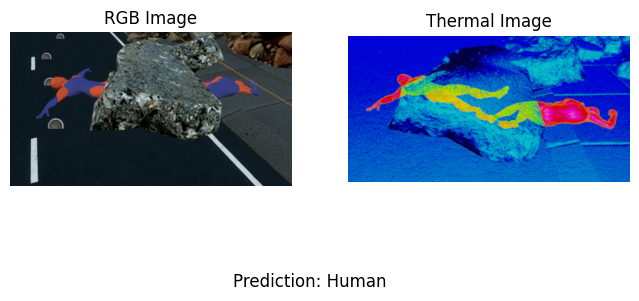

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Prediction: 0.9999973177909851


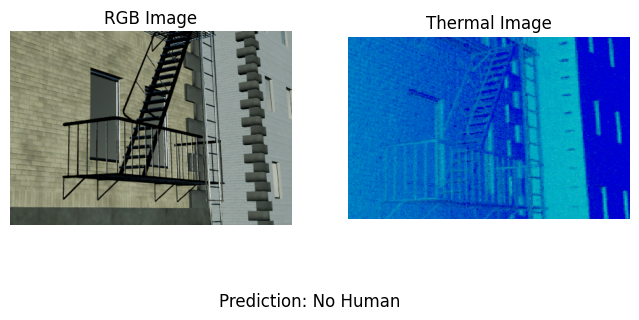

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Prediction: 0.9607934951782227


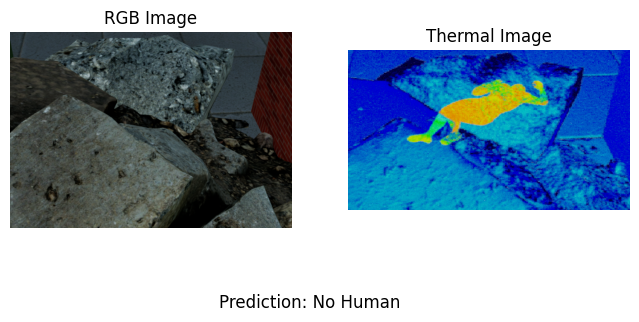

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Prediction: 0.010610572062432766


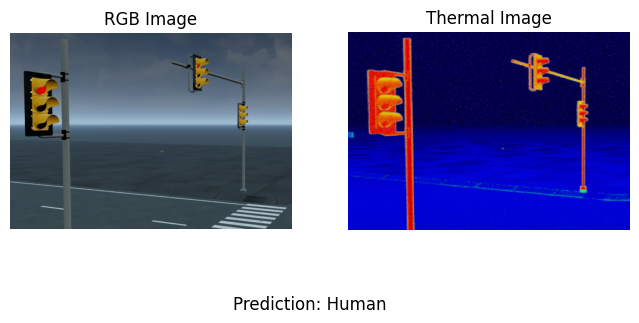

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Prediction: 0.06547900289297104


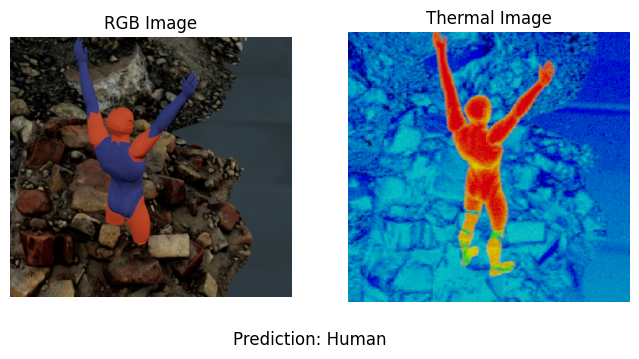

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.9913620352745056


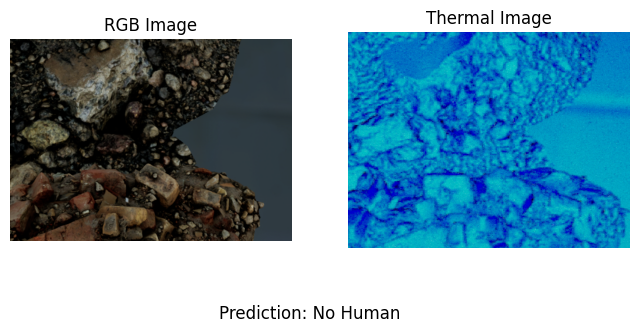

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.006785096600651741


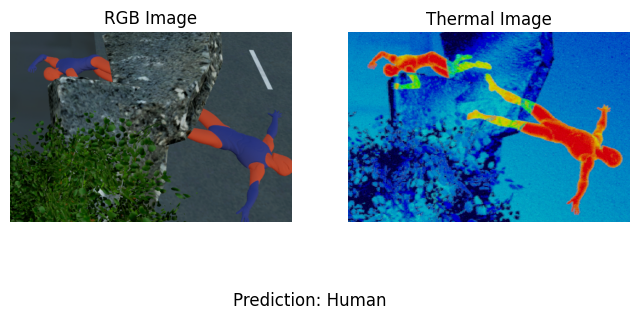

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.9525437355041504


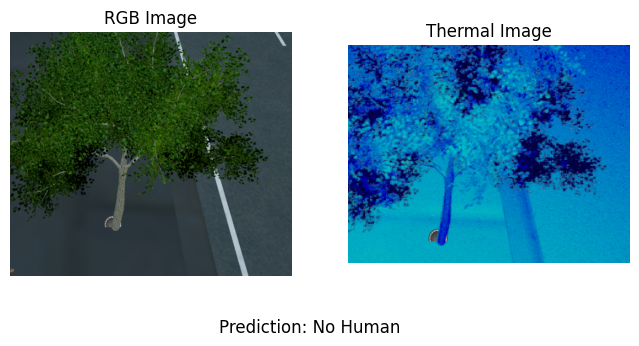

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.4725938141345978


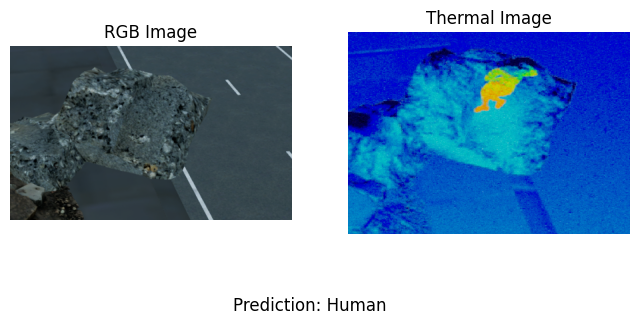

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Prediction: 0.24294941127300262


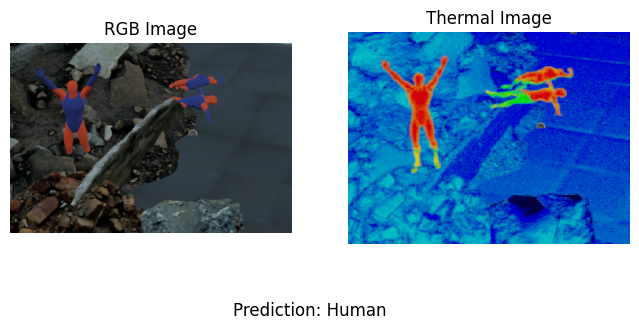

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Prediction: 0.7352168560028076


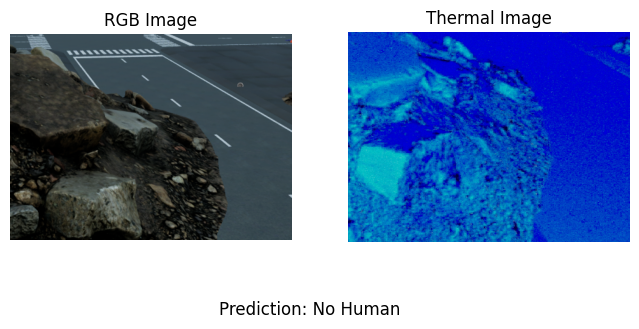

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prediction: 0.045048005878925323


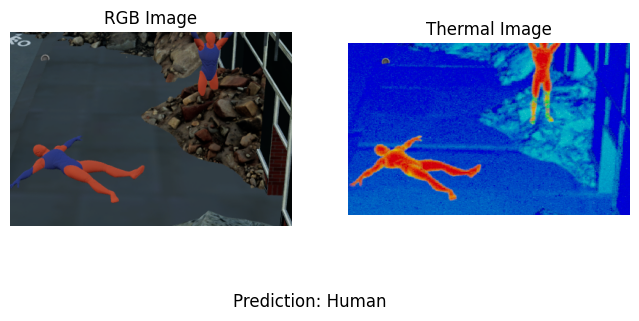

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Prediction: 0.08364623039960861


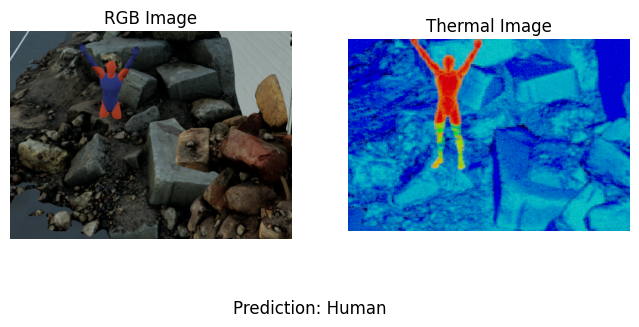

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.9838427901268005


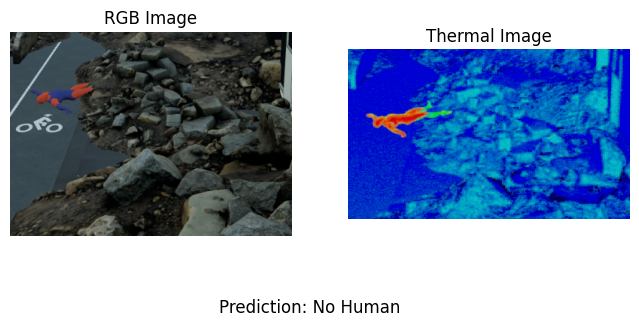

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Prediction: 0.9743169546127319


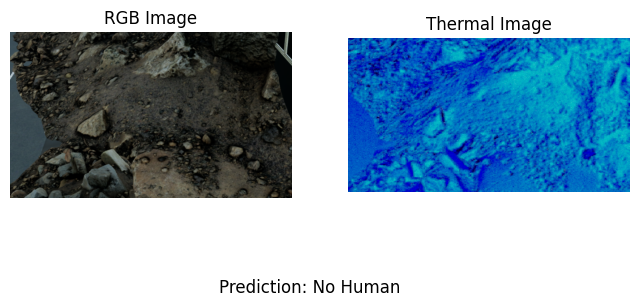

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Prediction: 0.8756570816040039


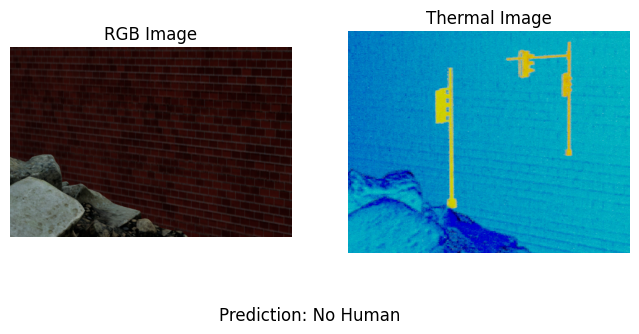

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Prediction: 0.1757373958826065


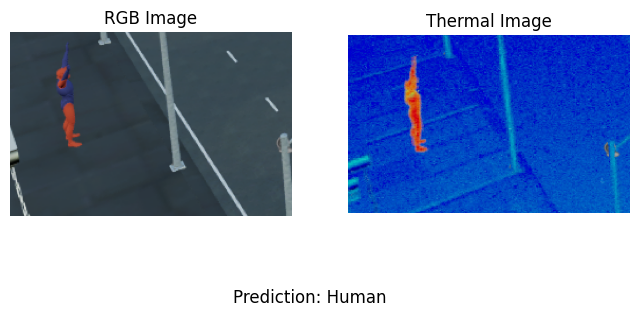

In [8]:
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(64,64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    return img_array
for i in range(1,18):
    rgb_image_path = r'Output_Images/RGB/R_'+str(i)+'.png'
    thermal_image_path = r'Output_Images/Thermal/T_'+str(i)+'.png'
    rgb_image = preprocess_image(rgb_image_path)
    thermal_image = preprocess_image(thermal_image_path)
    # Perform prediction
    prediction = model.predict({"rgb_input": rgb_image, "thermal_input": thermal_image})
    predicted_classes = (prediction > 0.5).astype(int)
    rgb_img_display = image.load_img(rgb_image_path)
    thermal_img_display = image.load_img(thermal_image_path)
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    # Display RGB image
    axes[0].imshow(rgb_img_display)
    axes[0].set_title('RGB Image')
    axes[0].axis('off')  # Turn off axis labels
    # Display Thermal image
    axes[1].imshow(thermal_img_display, cmap='inferno')
    axes[1].set_title('Thermal Image')
    axes[1].axis('off')
    print(f"Prediction: {prediction[0][0]}")
    if prediction[0][0]<0.5:
       prediction_text="Prediction: Human"
    else:
       prediction_text="Prediction: No Human"
    plt.figtext(0.5, 0.05, prediction_text, ha='center', fontsize=12)
    plt.show()

Found 108 images belonging to 2 classes.
Found 108 images belonging to 2 classes.
Found 42 images belonging to 2 classes.
Found 42 images belonging to 2 classes.



Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ rgb_input           │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ thermal_input       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 32768)     │    125,184 │ rgb_input[0][0]   │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 32768)     │    125,184 │ thermal_input[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 65536)     │          0 │ functional[0][0], │
│ (Concatenate)       │                   │            │ functional_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 1)         │     65,537 │ concatenate[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 315,905 (1.21 MB)

 Trainable params: 315,905 (1.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 298ms/step - accuracy: 0.4890 - loss: 0.6911 - val_accuracy: 0.5000 - val_loss: 0.6626
Epoch 2/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - accuracy: 0.4884 - loss: 0.6857 - val_accuracy: 0.5000 - val_loss: 0.6617
Epoch 3/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 861ms/step - accuracy: 0.5299 - loss: 0.6574 - val_accuracy: 0.7143 - val_loss: 0.6715
Epoch 4/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - accuracy: 0.6343 - loss: 0.6749 - val_accuracy: 0.7143 - val_loss: 0.6688
Epoch 5/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - accuracy: 0.6691 - loss: 0.6671 - val_accuracy: 0.5000 - val_loss: 0.6548
Epoch 6/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - accuracy: 0.5073 - loss: 0.6646 - val_accuracy: 0.5476 - val_loss: 0.6401
Epoch 7/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - accuracy: 0.5323 - loss: 0.6644 - val_accuracy: 0.6429 - val_loss: 0.6539
Epoch 8/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - accuracy: 0.7446 - loss: 0.6143 - val_accuracy: 0.6429 - val_loss:

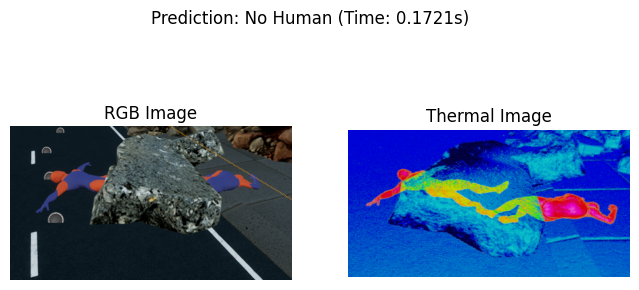

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Prediction: 0.9745350480079651


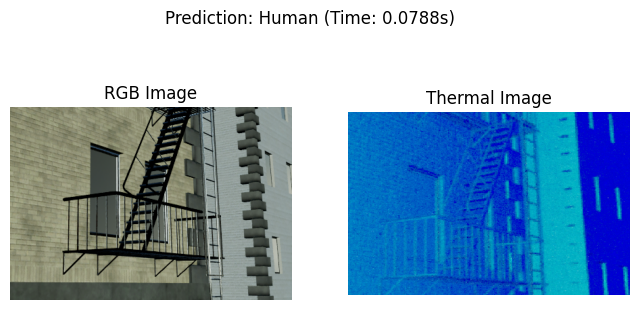

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Prediction: 0.9379428029060364


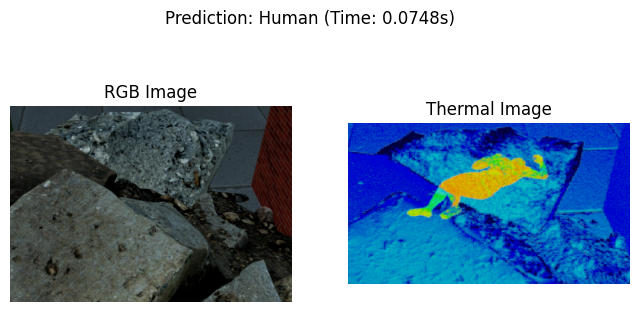

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Prediction: 0.8511968851089478


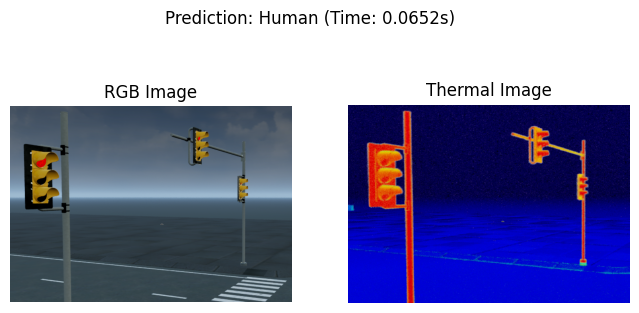

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction: 0.5468577146530151


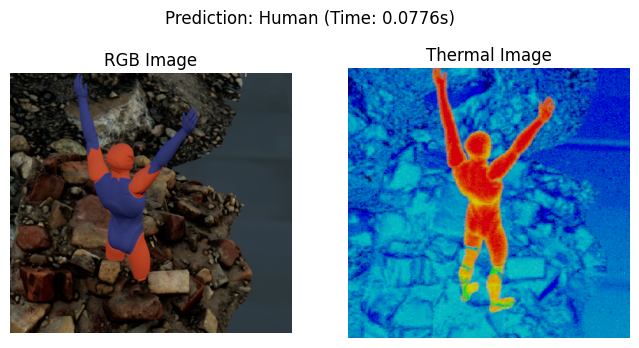

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Prediction: 0.803625762462616


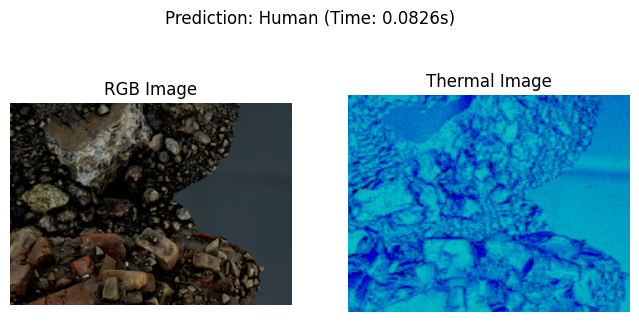

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Prediction: 0.19537022709846497


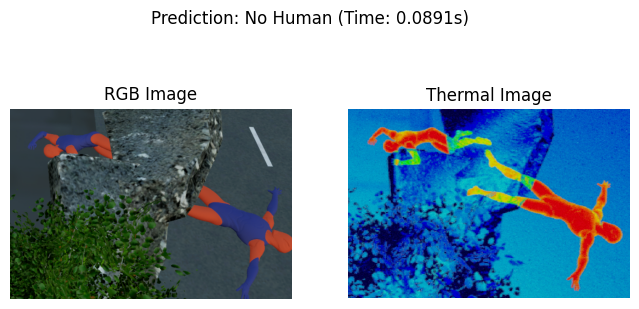

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction: 0.6120098829269409


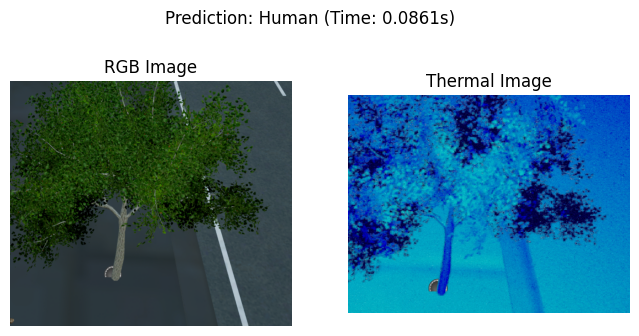

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Prediction: 0.60655677318573


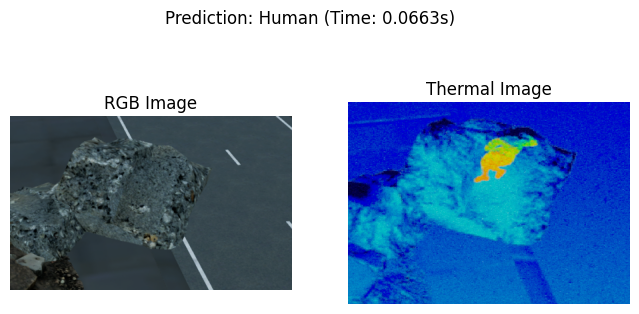

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Prediction: 0.5194741487503052


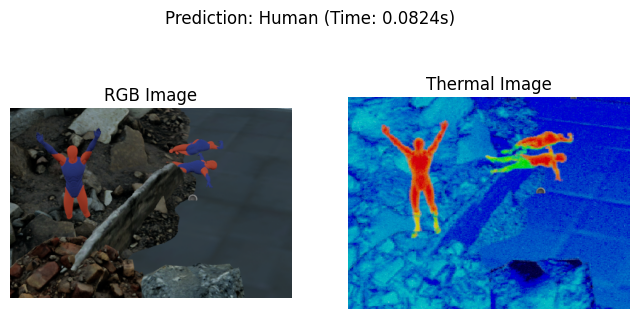

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Prediction: 0.6302423477172852


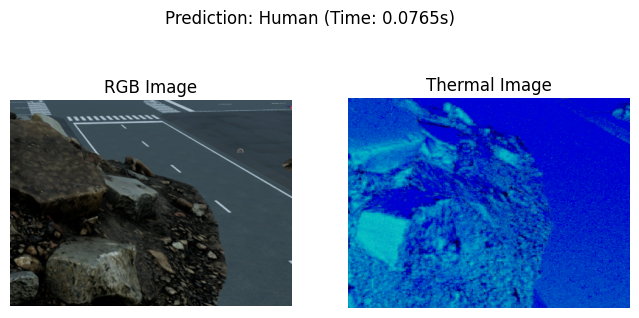

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Prediction: 0.09436401724815369


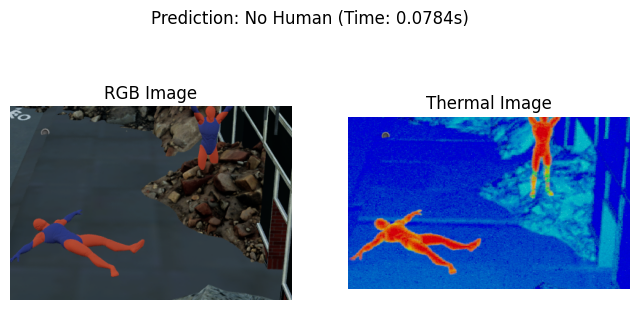

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Prediction: 0.5469518303871155


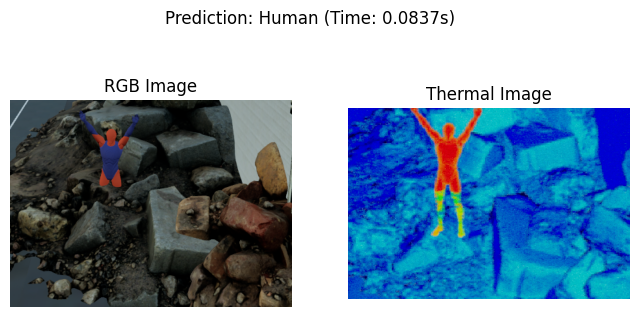

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Prediction: 0.7373377084732056


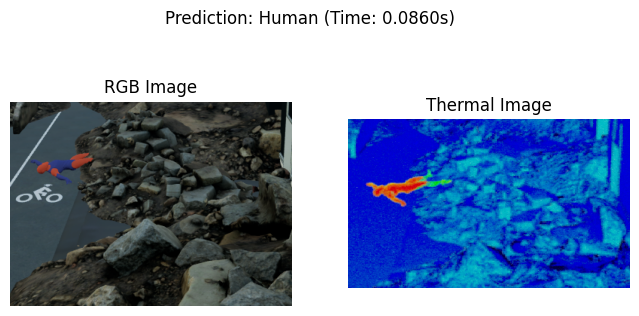

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Prediction: 0.7463138103485107


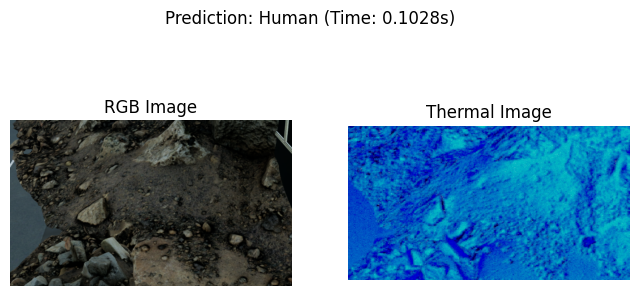

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Prediction: 0.5567140579223633


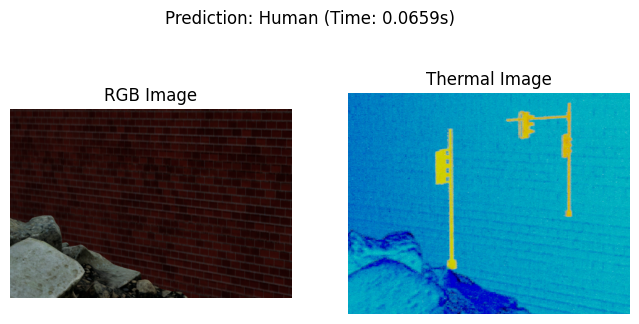

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Prediction: 0.5910779237747192


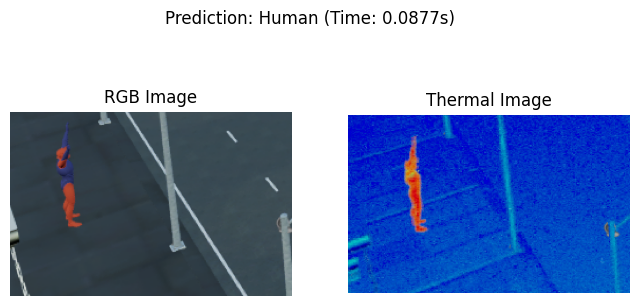

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Layer, Dense, Conv2D, MaxPooling2D, Flatten, Concatenate
import time  # Import the time module

# Dataset preparation using ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load RGB and thermal datasets (using subdirectories or separate paths)
# Assuming two generators - train_rgb and train_thermal
train_rgb_generator = train_datagen.flow_from_directory('D:/human-detect/content/RGB_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')
train_thermal_generator = train_datagen.flow_from_directory('D:/human-detect/content/Thermal_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')

test_rgb_generator = test_datagen.flow_from_directory('D:/human-detect/content/RGB_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')
test_thermal_generator = test_datagen.flow_from_directory('D:/human-detect/content/Thermal_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')
# Self-Attention Layer
class SelfAttention(layers.Layer):
    def __init__(self, embed_dim):
        super(SelfAttention, self).__init__()
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.scale = tf.sqrt(tf.cast(embed_dim, tf.float32))

    def call(self, inputs):
        query = self.query_dense(inputs)
        key = self.key_dense(inputs)
        value = self.value_dense(inputs)

        attn_scores = tf.matmul(query, key, transpose_b=True) / self.scale
        attn_weights = tf.nn.softmax(attn_scores, axis=-1)
        attn_output = tf.matmul(attn_weights, value)

        return attn_output

# CNN + Self-Attention for a Single Input (RGB or Thermal)
def cnn_self_attention_branch(input_shape):
    inputs = layers.Input(shape=input_shape)

    # CNN feature extraction
    x = layers.Conv2D(64, kernel_size=3, padding='same', activation='relu')(inputs)
    x = layers.MaxPooling2D(pool_size=2)(x)
    x = layers.Conv2D(128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    # Apply self-attention directly on the feature map
    flattened_dim = x.shape[-1]
    attention = SelfAttention(embed_dim=flattened_dim)(x)  # Avoids flattening first

    # Flatten after attention is applied
    x = layers.Flatten()(x)
    attention = layers.Flatten()(attention)

    # Concatenate original features with attention output
    concatenated = layers.Multiply()([x, attention])

    return models.Model(inputs, concatenated)
# Build separate branches for RGB and thermal inputs
rgb_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))
thermal_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))  # Assuming thermal images are grayscale

# Combined Model
rgb_input = layers.Input(shape=(64, 64, 3), name="rgb_input")
thermal_input = layers.Input(shape=(64, 64, 3), name="thermal_input")

# Apply separate CNN + Attention branches
rgb_features = rgb_branch(rgb_input)
thermal_features = thermal_branch(thermal_input)

# Concatenate features from both branches
combined_features = layers.Concatenate()([rgb_features, thermal_features])

# Classification Head
output = layers.Dense(1, activation='sigmoid')(combined_features)# Final model - Compile the model and assign the result back to 'model'
model = models.Model(inputs=[rgb_input, thermal_input], outputs=output)
model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])  # Assign the result of compile back to model

# Model summary
model.summary()# Training data
num_samples = len(train_rgb_generator.filenames)

train_rgb_data = np.zeros((num_samples, 64, 64, 3))
train_thermal_data = np.zeros((num_samples, 64, 64, 3))
train_labels = np.zeros((num_samples,))

for i in range(len(train_rgb_generator)):
    batch_rgb, batch_labels = train_rgb_generator[i]
    batch_thermal, _ = train_thermal_generator[i]

    start_idx = i * train_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    train_rgb_data[start_idx:end_idx] = batch_rgb
    train_thermal_data[start_idx:end_idx] = batch_thermal
    train_labels[start_idx:end_idx] = batch_labels

# Validation data
num_val_samples = len(test_rgb_generator.filenames)

test_rgb_data = np.zeros((num_val_samples, 64, 64, 3))
test_thermal_data = np.zeros((num_val_samples, 64, 64, 3))
test_labels = np.zeros((num_val_samples,))

for i in range(len(test_rgb_generator)):
    batch_rgb, batch_labels = test_rgb_generator[i]
    batch_thermal, _ = test_thermal_generator[i]

    start_idx = i * test_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    test_rgb_data[start_idx:end_idx] = batch_rgb
    test_thermal_data[start_idx:end_idx] = batch_thermal
    test_labels[start_idx:end_idx] = batch_labels
# Ensure the model input names match the keys used here.
his1=model.fit( x={"rgb_input": train_rgb_data,"thermal_input": train_thermal_data,},
                y=train_labels,epochs=15,validation_data=({"rgb_input": test_rgb_data,
            "thermal_input": test_thermal_data,},test_labels,),)
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(64,64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    return img_array
for i in range(1,18):
    rgb_image_path = r'Output_Images/RGB/R_'+str(i)+'.png'
    thermal_image_path = r'Output_Images/Thermal/T_'+str(i)+'.png'
    rgb_image = preprocess_image(rgb_image_path)
    thermal_image = preprocess_image(thermal_image_path)
    # Record start time
    start_time = time.time()
    # Perform prediction
    prediction = model.predict({"rgb_input": rgb_image, "thermal_input": thermal_image})
    # Record end time
    end_time = time.time()
    # Calculate inference time
    inference_time = end_time - start_time
    predicted_classes = (prediction > 0.5).astype(int)
    rgb_img_display = image.load_img(rgb_image_path)
    thermal_img_display = image.load_img(thermal_image_path)
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    # Display RGB image
    axes[0].imshow(rgb_img_display)
    axes[0].set_title('RGB Image')
    axes[0].axis('off')  # Turn off axis labels
    # Display Thermal image
    axes[1].imshow(thermal_img_display, cmap='inferno')
    axes[1].set_title('Thermal Image')
    axes[1].axis('off')
    print(f"Prediction: {prediction[0][0]}")
    if prediction[0][0]>0.5:
       prediction_text="Prediction: Human"
    else:
       prediction_text="Prediction: (No Human)"
    # Add prediction and time as text on top of the image
    fig.suptitle(f"{prediction_text} (Time: {inference_time:.4f}s)", fontsize=12)
    plt.show()


Found 108 images belonging to 2 classes.
Found 108 images belonging to 2 classes.
Found 42 images belonging to 2 classes.
Found 42 images belonging to 2 classes.


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ rgb_input           │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ thermal_input       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ (None, 32768)     │    125,184 │ rgb_input[0][0]   │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_4        │ (None, 32768)     │    125,184 │ thermal_input[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 65536)     │          0 │ functional_3[0][… │
│ (Concatenate)       │                   │            │ functional_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 1)         │     65,537 │ concatenate_1[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 315,905 (1.21 MB)

 Trainable params: 315,905 (1.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - accuracy: 0.5311 - loss: 0.6884 - val_accuracy: 0.5000 - val_loss: 0.6667
Epoch 2/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - accuracy: 0.4939 - loss: 0.6529 - val_accuracy: 0.6190 - val_loss: 0.6574
Epoch 3/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - accuracy: 0.6181 - loss: 0.6550 - val_accuracy: 0.7143 - val_loss: 0.5841
Epoch 4/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - accuracy: 0.7384 - loss: 0.5743 - val_accuracy: 0.8571 - val_loss: 0.5229
Epoch 5/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - accuracy: 0.7346 - loss: 0.5450 - val_accuracy: 0.7381 - val_loss: 0.4973
Epoch 6/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - accuracy: 0.7160 - loss: 0.5398 - val_accuracy: 0.8095 - val_loss: 0.4109
Epoch 7/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - accuracy: 0.7999 - loss: 0.4731 - val_accuracy: 0.8810 - val_loss: 0.3942
Epoch 8/15
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - accuracy: 0.7846 - loss: 0.4008 - val_accuracy: 0.8095 - val_loss:

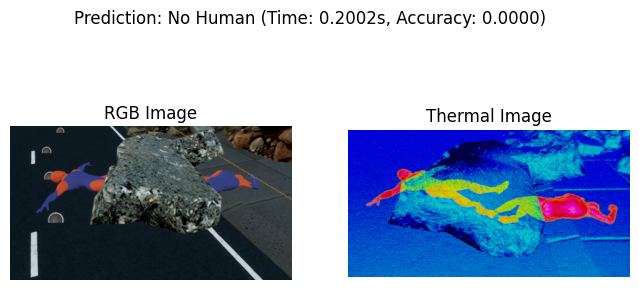

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


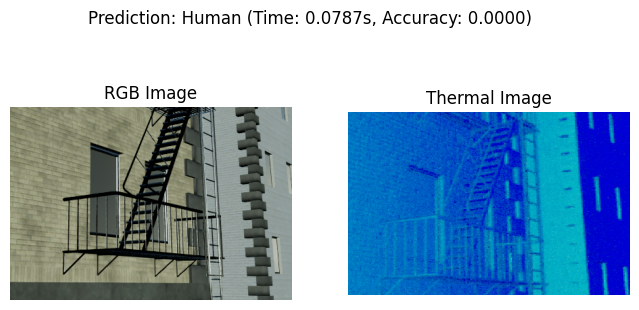

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


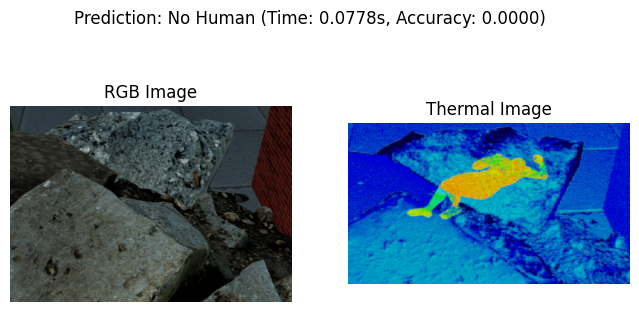

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


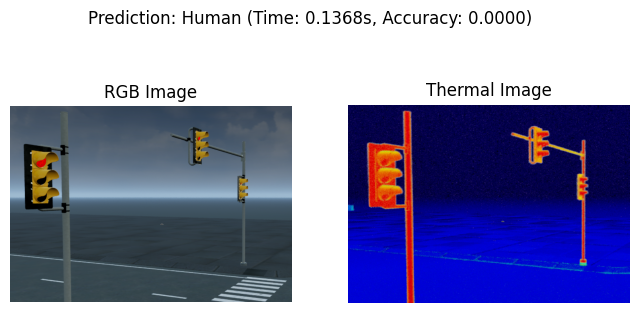

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


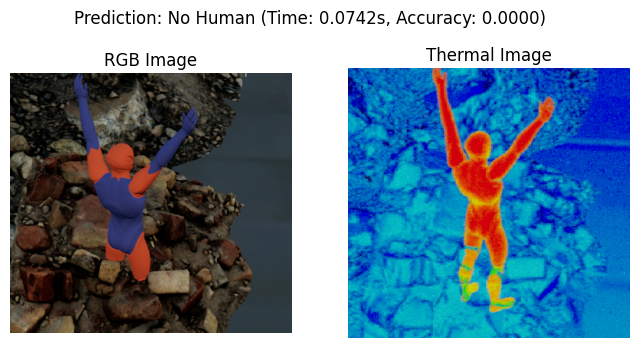

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


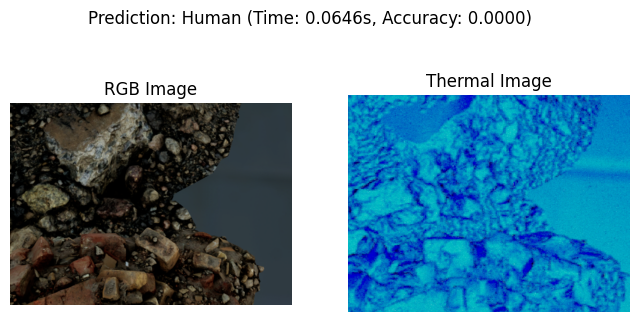

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


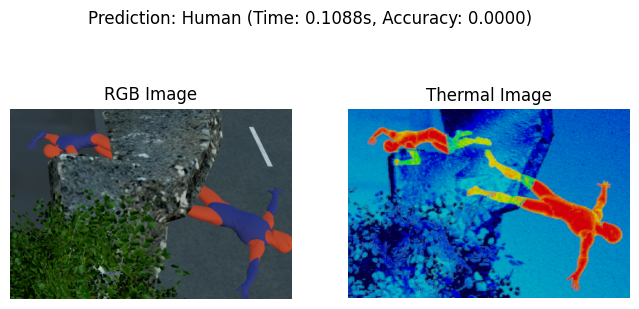

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


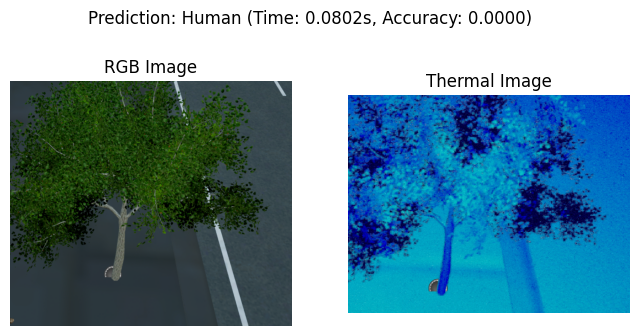

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


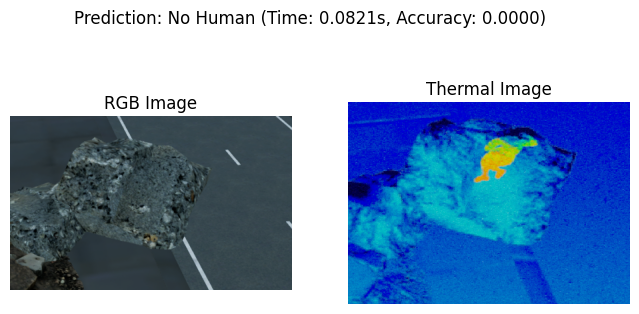

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


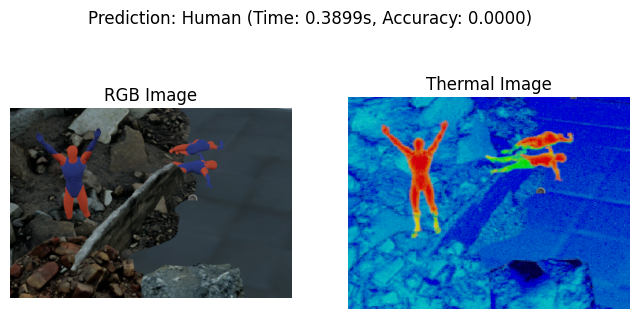

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


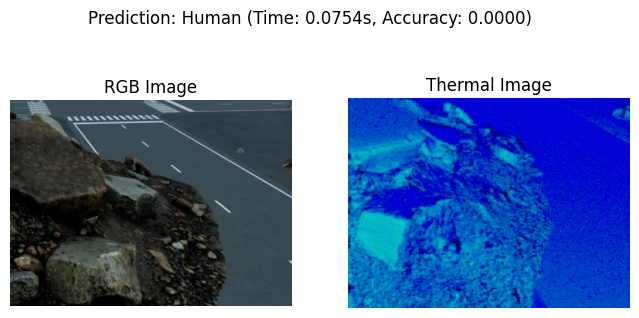

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


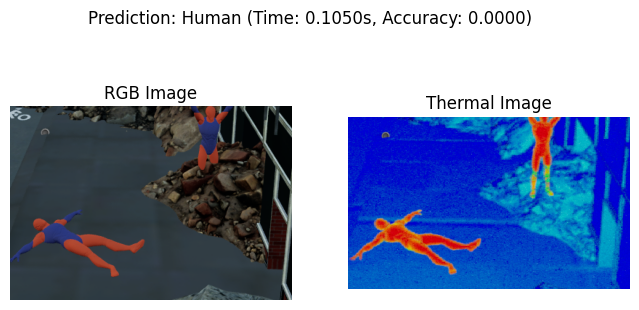

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


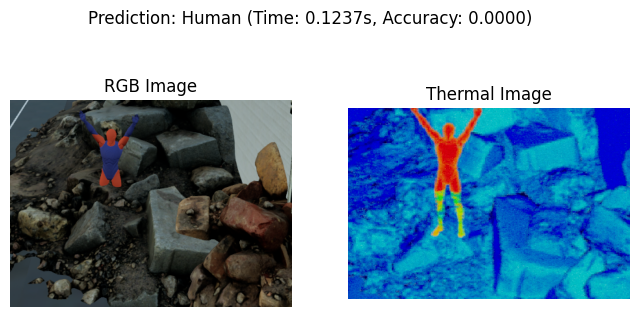

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


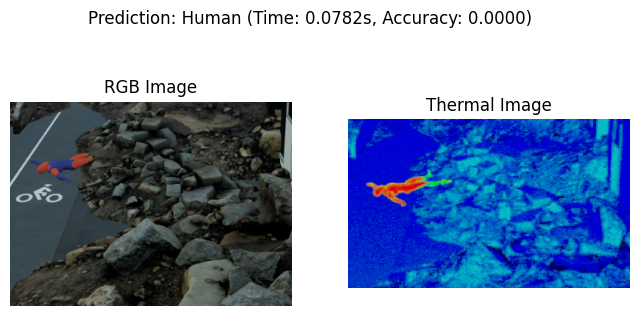

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


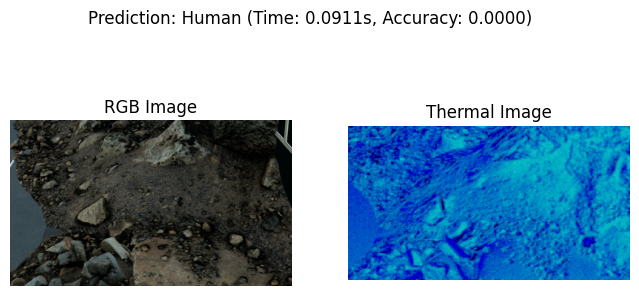

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


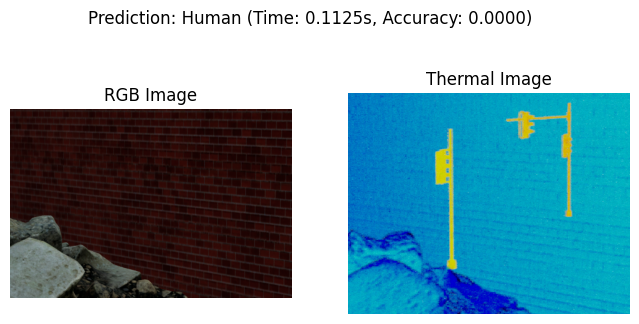

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


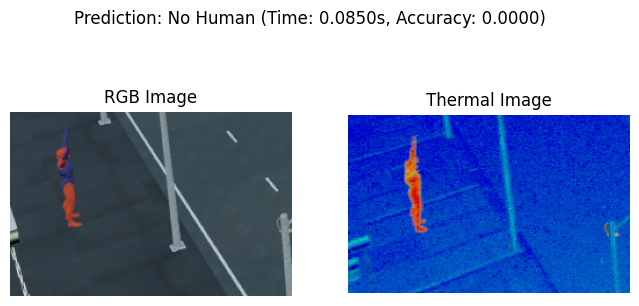

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Layer, Dense, Conv2D, MaxPooling2D, Flatten, Concatenate
import time  # Import the time module
from tensorflow.keras.metrics import Accuracy  # Import Accuracy

# Dataset preparation using ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load RGB and thermal datasets (using subdirectories or separate paths)
# Assuming two generators - train_rgb and train_thermal
train_rgb_generator = train_datagen.flow_from_directory('D:/human-detect/content/RGB_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')
train_thermal_generator = train_datagen.flow_from_directory('D:/human-detect/content/Thermal_Dataset/Training', target_size=(64, 64), batch_size=32, class_mode='binary')

test_rgb_generator = test_datagen.flow_from_directory('D:/human-detect/content/RGB_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')
test_thermal_generator = test_datagen.flow_from_directory('D:/human-detect/content/Thermal_Dataset/Testing', target_size=(64, 64), batch_size=32, class_mode='binary')
# Self-Attention Layer
class SelfAttention(layers.Layer):
    def __init__(self, embed_dim):
        super(SelfAttention, self).__init__()
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.scale = tf.sqrt(tf.cast(embed_dim, tf.float32))

    def call(self, inputs):
        query = self.query_dense(inputs)
        key = self.key_dense(inputs)
        value = self.value_dense(inputs)

        attn_scores = tf.matmul(query, key, transpose_b=True) / self.scale
        attn_weights = tf.nn.softmax(attn_scores, axis=-1)
        attn_output = tf.matmul(attn_weights, value)

        return attn_output

# CNN + Self-Attention for a Single Input (RGB or Thermal)
def cnn_self_attention_branch(input_shape):
    inputs = layers.Input(shape=input_shape)

    # CNN feature extraction
    x = layers.Conv2D(64, kernel_size=3, padding='same', activation='relu')(inputs)
    x = layers.MaxPooling2D(pool_size=2)(x)
    x = layers.Conv2D(128, kernel_size=3, padding='same', activation='relu')(x)
    x = layers.MaxPooling2D(pool_size=2)(x)

    # Apply self-attention directly on the feature map
    flattened_dim = x.shape[-1]
    attention = SelfAttention(embed_dim=flattened_dim)(x)  # Avoids flattening first

    # Flatten after attention is applied
    x = layers.Flatten()(x)
    attention = layers.Flatten()(attention)

    # Concatenate original features with attention output
    concatenated = layers.Multiply()([x, attention])

    return models.Model(inputs, concatenated)
# Build separate branches for RGB and thermal inputs
rgb_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))
thermal_branch = cnn_self_attention_branch(input_shape=(64, 64, 3))  # Assuming thermal images are grayscale

# Combined Model
rgb_input = layers.Input(shape=(64, 64, 3), name="rgb_input")
thermal_input = layers.Input(shape=(64, 64, 3), name="thermal_input")

# Apply separate CNN + Attention branches
rgb_features = rgb_branch(rgb_input)
thermal_features = thermal_branch(thermal_input)

# Concatenate features from both branches
combined_features = layers.Concatenate()([rgb_features, thermal_features])

# Classification Head
output = layers.Dense(1, activation='sigmoid')(combined_features)# Final model - Compile the model and assign the result back to 'model'
model = models.Model(inputs=[rgb_input, thermal_input], outputs=output)
model.compile(optimizer=optimizers.Adam(learning_rate=0.001),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])  # Assign the result of compile back to model

# Model summary
model.summary()# Training data
num_samples = len(train_rgb_generator.filenames)

train_rgb_data = np.zeros((num_samples, 64, 64, 3))
train_thermal_data = np.zeros((num_samples, 64, 64, 3))
train_labels = np.zeros((num_samples,))

for i in range(len(train_rgb_generator)):
    batch_rgb, batch_labels = train_rgb_generator[i]
    batch_thermal, _ = train_thermal_generator[i]

    start_idx = i * train_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    train_rgb_data[start_idx:end_idx] = batch_rgb
    train_thermal_data[start_idx:end_idx] = batch_thermal
    train_labels[start_idx:end_idx] = batch_labels

# Validation data
num_val_samples = len(test_rgb_generator.filenames)

test_rgb_data = np.zeros((num_val_samples, 64, 64, 3))
test_thermal_data = np.zeros((num_val_samples, 64, 64, 3))
test_labels = np.zeros((num_val_samples,))

for i in range(len(test_rgb_generator)):
    batch_rgb, batch_labels = test_rgb_generator[i]
    batch_thermal, _ = test_thermal_generator[i]

    start_idx = i * test_rgb_generator.batch_size
    end_idx = start_idx + batch_rgb.shape[0]

    test_rgb_data[start_idx:end_idx] = batch_rgb
    test_thermal_data[start_idx:end_idx] = batch_thermal
    test_labels[start_idx:end_idx] = batch_labels
# Ensure the model input names match the keys used here.
his1=model.fit( x={"rgb_input": train_rgb_data,"thermal_input": train_thermal_data,},
                y=train_labels,epochs=15,validation_data=({"rgb_input": test_rgb_data,
            "thermal_input": test_thermal_data,},test_labels,),)
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(64,64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    return img_array
# Instantiate the accuracy metric
accuracy_metric = Accuracy()
for i in range(1,18):
    rgb_image_path = r'Output_Images/RGB/R_'+str(i)+'.png'
    thermal_image_path = r'Output_Images/Thermal/T_'+str(i)+'.png'
    rgb_image = preprocess_image(rgb_image_path)
    thermal_image = preprocess_image(thermal_image_path)
    # Record start time
    start_time = time.time()
    # Perform prediction
    prediction = model.predict({"rgb_input": rgb_image, "thermal_input": thermal_image})
    # Record end time
    end_time = time.time()
    # Calculate inference time
    inference_time = end_time - start_time
    predicted_classes = (prediction > 0.5).astype(int)
    rgb_img_display = image.load_img(rgb_image_path)
    thermal_img_display = image.load_img(thermal_image_path)
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    # Display RGB image
    axes[0].imshow(rgb_img_display)
    axes[0].set_title('RGB Image')
    axes[0].axis('off')  # Turn off axis labels
    # Display Thermal image
    axes[1].imshow(thermal_img_display, cmap='inferno')
    axes[1].set_title('Thermal Image')
    axes[1].axis('off')
    # Determine prediction text
    if prediction[0][0] > 0.5:
        prediction_text = "Prediction: Human"
    else:
        prediction_text = "Prediction: No Human"
    # Calculate accuracy
        accuracy_metric.update_state(np.array([int(prediction[0][0] > 0.5)]), np.array([1]))  # Assuming ground truth is 1 for human, 0 for no human
    accuracy = accuracy_metric.result().numpy()
    # Add prediction, time, and accuracy as text on top of the image
    fig.suptitle(f"{prediction_text} (Time: {inference_time:.4f}s, Accuracy: {accuracy:.4f})", fontsize=12)
    plt.show()


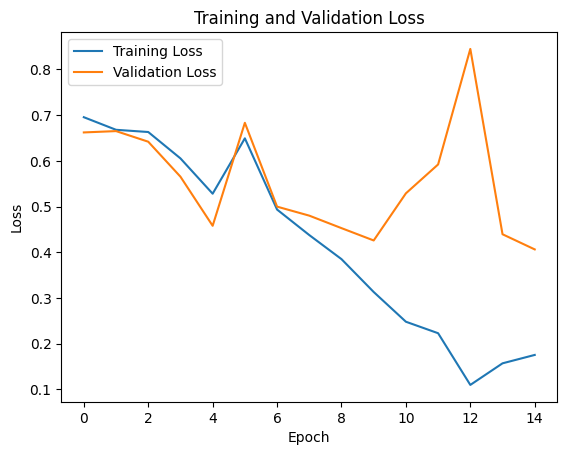

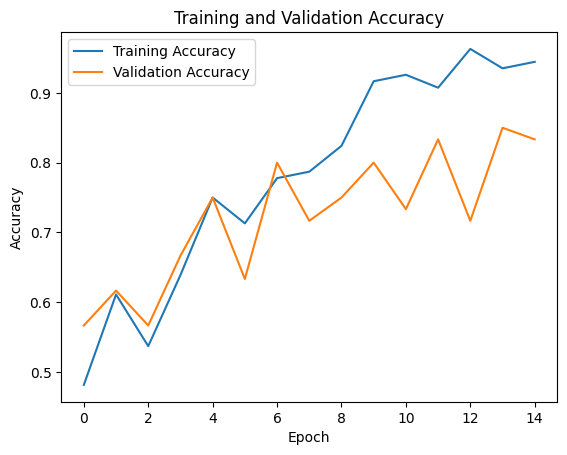

In [68]:
plt.plot(his1.history['loss'], label='Training Loss')
plt.plot(his1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(his1.history['accuracy'], label='Training Accuracy')
plt.plot(his1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step
              precision    recall  f1-score   support

         0.0       0.83      0.83      0.83        30
         1.0       0.83      0.83      0.83        30

    accuracy                           0.83        60
   macro avg       0.83      0.83      0.83        60
weighted avg       0.83      0.83      0.83        60



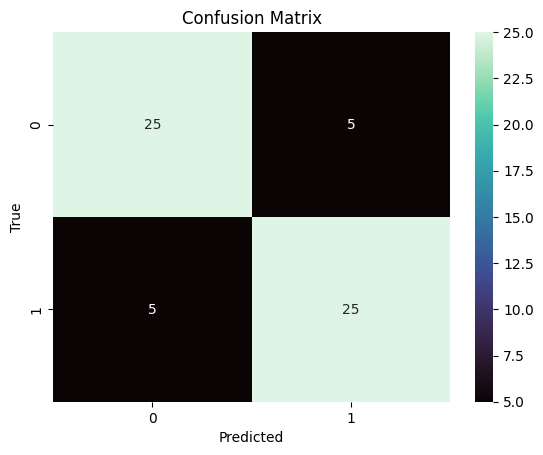

In [69]:
from sklearn.metrics import classification_report
# Make predictions on your test data
predictions = model.predict({"rgb_input": test_rgb_data,"thermal_input": test_thermal_data,})
# Convert predictions to class labels (if needed)
predicted_labels = (predictions > 0.5).astype(int)  # Example for binary classification
# Calculate evaluation metrics

print(classification_report(test_labels, predicted_labels))
cm = confusion_matrix(test_labels, predicted_labels)
sns.heatmap(cm, annot=True, fmt="d", cmap="mako")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [70]:
accuracy= (25+25)/ 60
accuracy

0.8333333333333334

In [71]:
precision=23/(23+5)
precision

0.8214285714285714

In [72]:
recall=23/(23+5)
recall

0.8214285714285714

In [73]:
f1_score=2*precision*recall/(precision+recall)
f1_score

0.8214285714285714